In [1]:
import os
import pickle, gzip
import numpy as np
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
from astropy.table import Table

import slsim.Sources as sources
import slsim.Deflectors as deflectors
from slsim.FalsePositives.false_positive_pop import FalsePositivePop
from utils import plot_montage

import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

# Define output directory and draw count
output_dir = "../saved_objects"
os.makedirs(output_dir, exist_ok=True)
N_DRAW = 10000  # 10k per category = 50k total

In [2]:
# ==========================================
# Cell 2: Cosmology & Load Catalogs
# ==========================================
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

sky_area_galaxy = Quantity(2, "deg2")
sky_area_quasar = Quantity(24.0, "deg2")
# sky_area_quasar = Quantity(10.0, "deg2")
sky_area_stars = Quantity(10.0, "deg2")

print("Loading pre-computed SkyPy catalogs...")
red_galaxy_catalog = Table.read(f'../catalogs/skypy_red_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
blue_galaxy_catalog = Table.read(f'../catalogs/skypy_blue_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
all_galaxy_catalog = Table.read(f'../catalogs/skypy_all_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')

print("Loading Quasar and Star catalogs...")
quasar_host_catalog = Table.read('../catalogs/agile_qsos.fits', format='fits')
# quasar_host_catalog = Table.read('../catalogs/slsim_qsos.fits', format='fits')
quasar_catalog = quasar_host_catalog.copy()['z', 'ps_mag_g', 'ps_mag_r', 'ps_mag_i', 'ps_mag_z', 'ps_mag_y']

# Load and format the LSST stars catalog
raw_star_catalog = Table.read('../catalogs/lsst_stars_catalog_100k.csv', format='csv')
star_catalog = Table(
    data={
        'z': 0*np.ones_like(raw_star_catalog['gmag']),
        'ps_mag_g': raw_star_catalog['gmag'],
        'ps_mag_r': raw_star_catalog['rmag'],
        'ps_mag_i': raw_star_catalog['imag'],
        'ps_mag_z': raw_star_catalog['zmag'],
        'ps_mag_y': raw_star_catalog['ymag']
    }
)
print("All catalogs loaded successfully.")

Loading pre-computed SkyPy catalogs...
Loading Quasar and Star catalogs...
All catalogs loaded successfully.


In [3]:
# ==========================================
# Cell 3: Define Populations
# ==========================================
kwargs_deflector_cut = {"band": "i", "band_min": 19, "band_max": 26, "z_min": 0.00, "z_max": 2.5}
kwargs_source_galaxy_cut = {"band": "i", "band_max": 26, "z_min": 0.00, "z_max": 5.0}
kwargs_source_quasar_cut = {"band": "i", "band_max": 26, "z_min": 0.00, "z_max": 5.0}
kwargs_source_stars_cut = {"band": "i", "band_max": 26, "z_min": -1e-10, "z_max": 5.0}

lens_galaxy_pop = deflectors.EllipticalLensGalaxies(
    galaxy_list=red_galaxy_catalog,
    kwargs_cut=kwargs_deflector_cut,
    gamma_pl={"mean": 2.0, "std_dev": 0.16},
    cosmo=cosmo,
    sky_area=sky_area_galaxy,
    kwargs_mass2light={}
)

source_galaxy_pop = sources.Galaxies(
    galaxy_list=blue_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)
field_galaxy_pop = sources.Galaxies(
    galaxy_list=all_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, catalog_type="skypy"
)
source_quasar_host_pop = sources.PointPlusExtendedSources(
    point_plus_extended_sources_list=quasar_host_catalog, 
    cosmo=cosmo, sky_area=sky_area_quasar, 
    point_source_type="quasar", 
    extended_source_type="double_sersic",
    # extended_source_type="single_sersic", 
    kwargs_cut=kwargs_source_quasar_cut
)
source_quasar_pop = sources.PointSources(
    point_source_list=quasar_catalog, cosmo=cosmo, 
    sky_area=sky_area_quasar, point_source_type="quasar", kwargs_cut=kwargs_source_quasar_cut
)
source_star_pop = sources.PointSources(
    point_source_list=star_catalog, cosmo=cosmo, 
    sky_area=sky_area_stars, point_source_type="quasar", # we set this to "quasar" just to reuse the slsim architecture, but these are actually stars with their magnitudes 
    kwargs_cut=kwargs_source_stars_cut
)

In [4]:
# ==========================================
# Cell 4: Generation Helper Function (Batched)
# ==========================================
def generate_and_save(fp_pop, name, n_draw=N_DRAW, batch_size=1000):
    print(f"--- Generating {n_draw} {name} non-lenses in batches of {batch_size} ---")
    
    fp_objects = []
    num_batches = n_draw // batch_size
    remainder = n_draw % batch_size
    
    # Process full batches
    for i in range(num_batches):
        print(f"  Processing batch {i+1}/{num_batches}...")
        batch_objects = fp_pop.draw_false_positive(batch_size)
        fp_objects.extend(batch_objects)
        
    # Process any leftover items
    if remainder > 0:
        print(f"  Processing final partial batch of {remainder}...")
        batch_objects = fp_pop.draw_false_positive(remainder)
        fp_objects.extend(batch_objects)
        
    filepath = os.path.join(output_dir, f"nonlenses_{name}_{n_draw}.pkl")
    
    print("  Pickling objects to disk (this might take a moment)...")
    with open(filepath, "wb") as f:
        pickle.dump(fp_objects, f)
        
    print(f"Saved {len(fp_objects)} objects to {filepath}\n")

    return fp_objects

## Draw and Save Non-Lenses

--- Generating 10000 gal_gal_agn non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_gal_gal_agn_10000.pkl



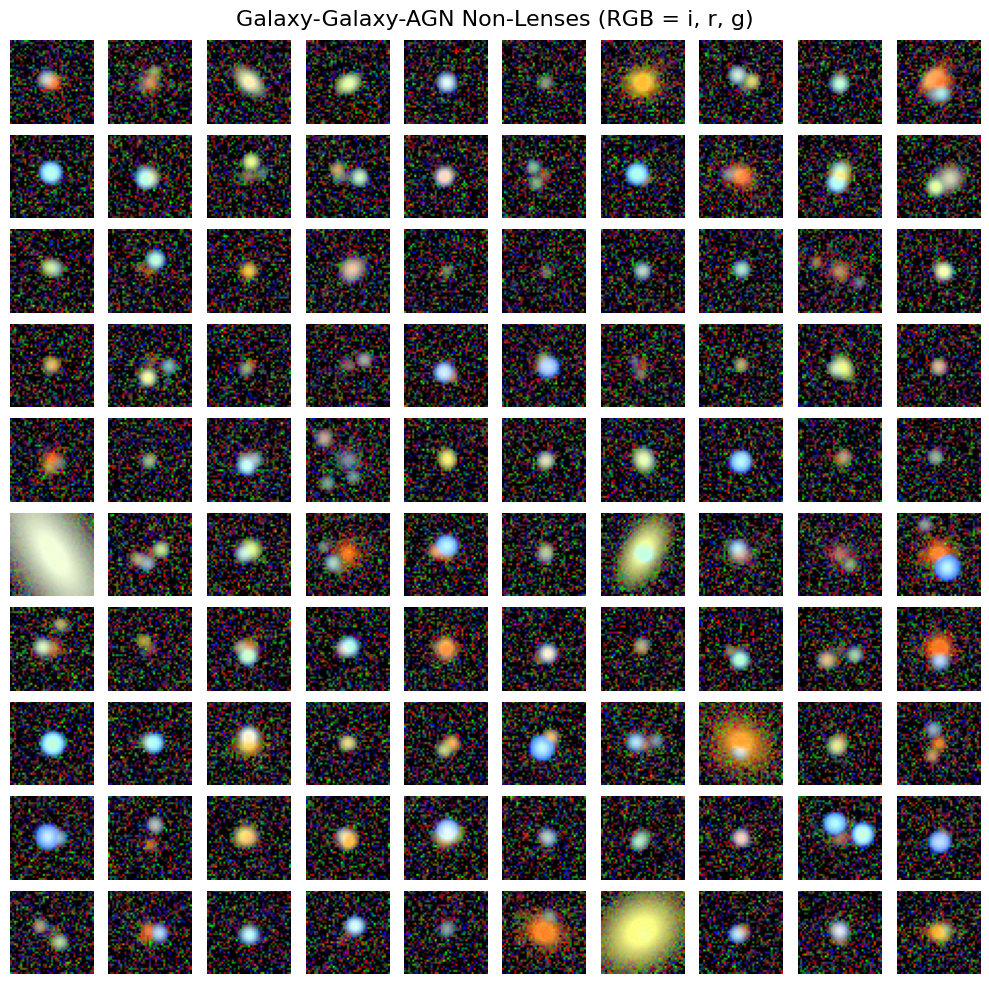

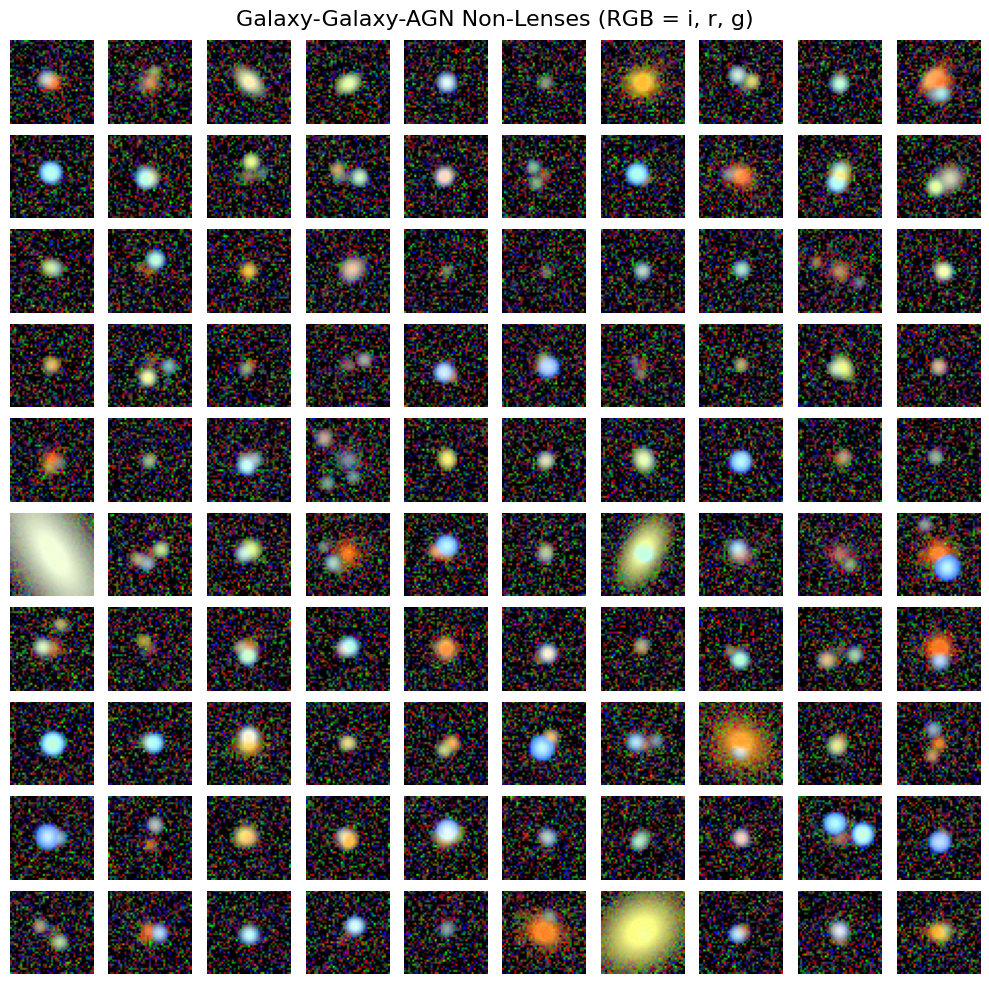

In [ ]:
# ==========================================
# Cell 5: Cat 1 - Galaxy-Galaxy-AGN 
# Central Galaxy + 1 source galaxy + (1 or 2 AGNs)
# ==========================================
fp_gal_gal_agn = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_galaxy_pop, source_quasar_pop],
    intruder_number_choices=[[1], [1, 2]], 
    cosmo=cosmo,
    include_central_galaxy_light=True,
)
gal_gal_agn_nonlenses = generate_and_save(fp_gal_gal_agn, "gal_gal_agn")
plot_montage(gal_gal_agn_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Galaxy-Galaxy-AGN Non-Lenses (RGB = i, r, g)");

--- Generating 10000 qso_gal non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_qso_gal_10000.pkl



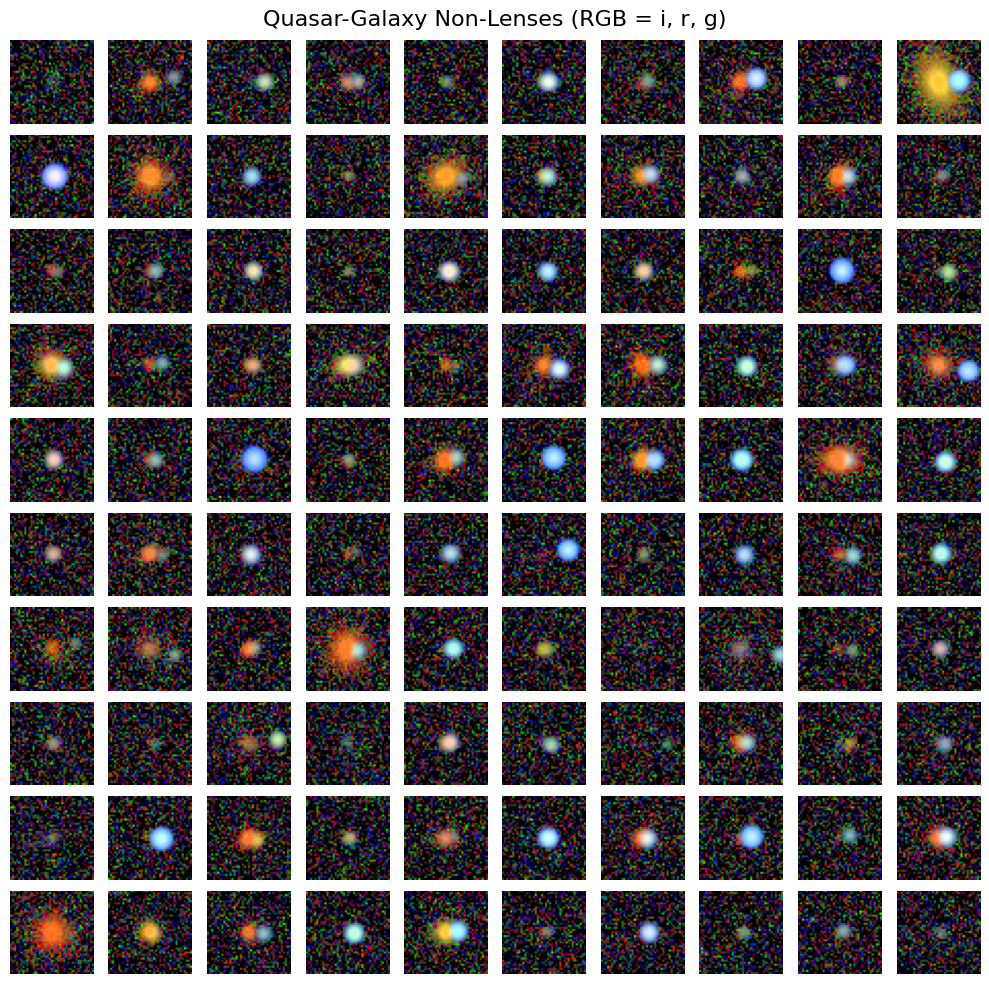

In [8]:
# ==========================================
# Cell 6: Cat 2 - Quasar-Galaxy 
# Central Galaxy + 1 closeby AGN (with host)
# ==========================================
fp_qso_gal = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_quasar_pop],
    intruder_number_choices=[[1]],
    cosmo=cosmo,
    clustering_mode="ring",
    include_central_galaxy_light=True,
)
qso_gal_nonlenses = generate_and_save(fp_qso_gal, "qso_gal")
plot_montage(qso_gal_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Quasar-Galaxy Non-Lenses (RGB = i, r, g)");

--- Generating 10000 qso_qso non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_qso_qso_10000.pkl



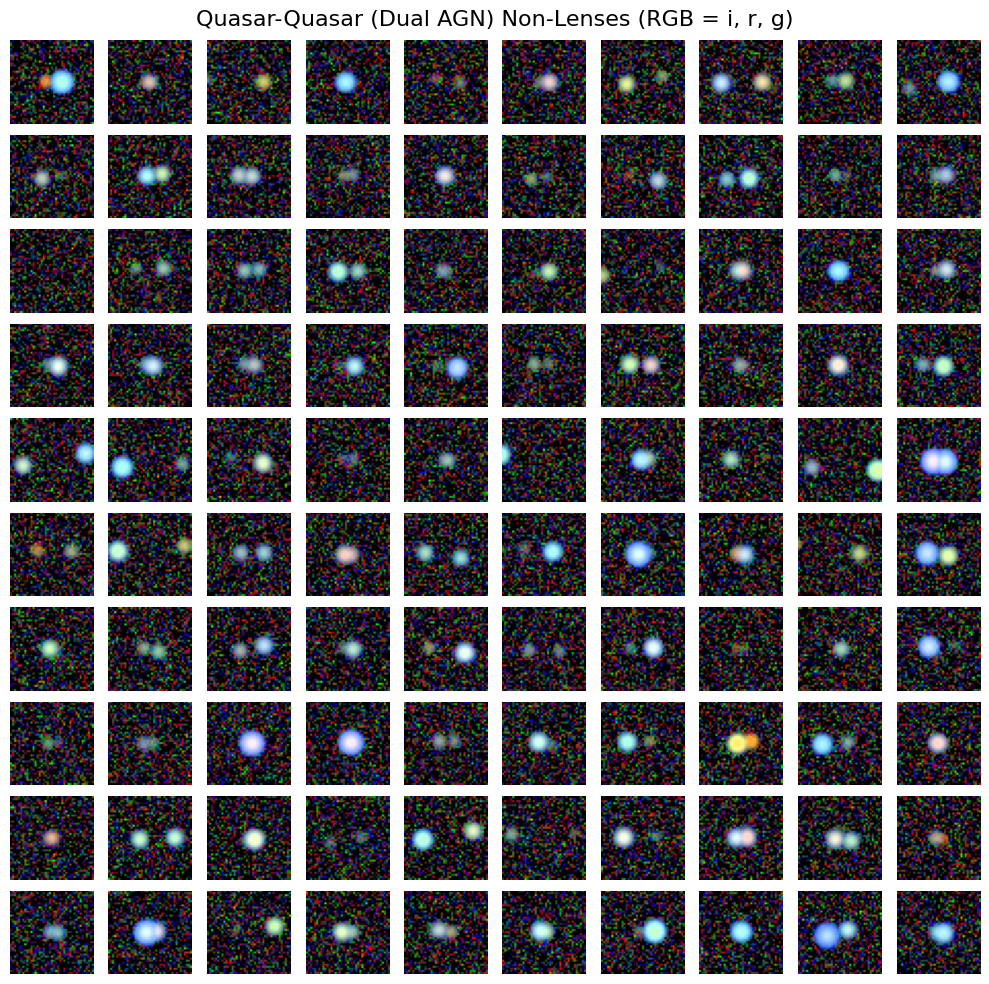

In [9]:
# ==========================================
# Cell 7: Cat 3 - Quasar-Quasar (Dual AGN)
# Dual AGNs
# ==========================================
fp_qso_qso = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_quasar_pop, source_quasar_pop],
    intruder_number_choices=[[1], [1]],
    cosmo=cosmo,
    clustering_mode="ring",
    include_central_galaxy_light=False,
)
qso_qso_nonlenses = generate_and_save(fp_qso_qso, "qso_qso")
plot_montage(qso_qso_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Quasar-Quasar (Dual AGN) Non-Lenses (RGB = i, r, g)");

--- Generating 10000 qso_star non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_qso_star_10000.pkl



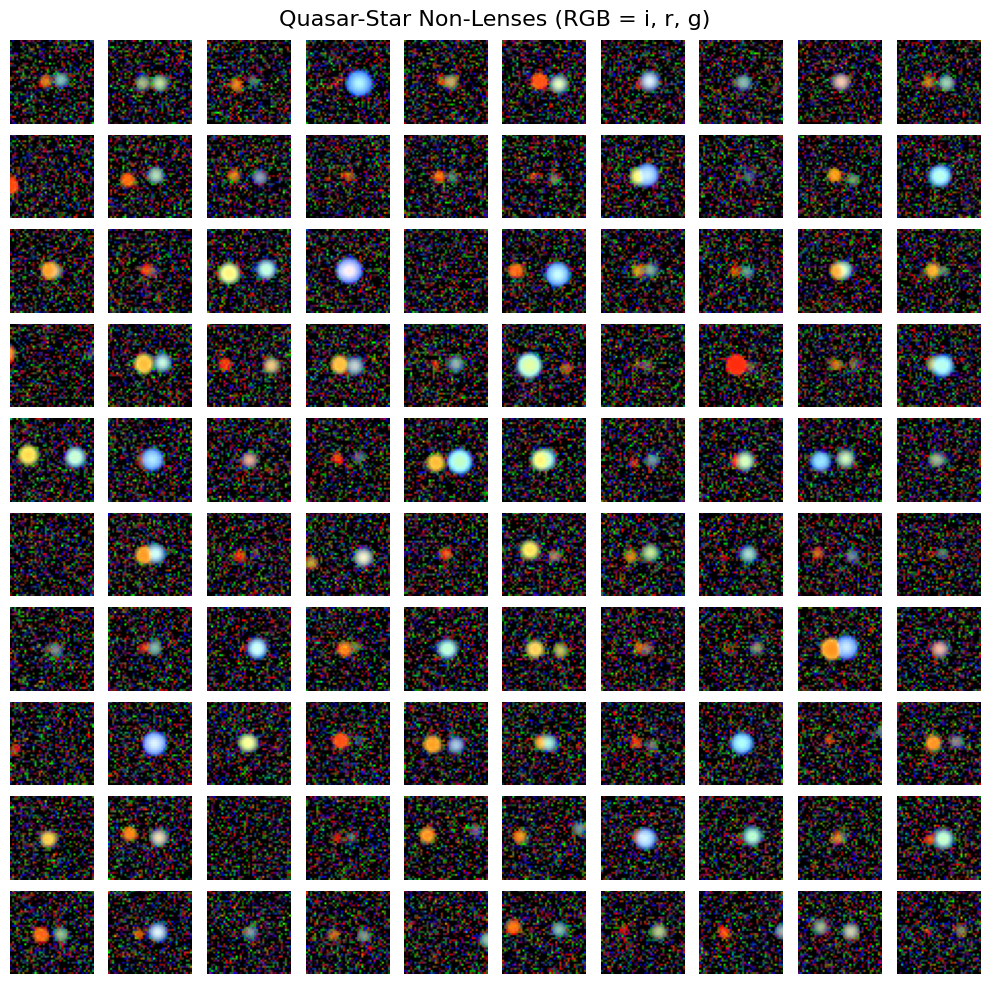

In [10]:
# ==========================================
# Cell 8: Cat 4 - Quasar-Star 
# A star and an AGN closeby
# ==========================================
fp_qso_star = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_quasar_pop, source_star_pop],
    intruder_number_choices=[[1], [1]],
    cosmo=cosmo,
    clustering_mode="ring",
    include_central_galaxy_light=False,
)
qso_star_nonlenses = generate_and_save(fp_qso_star, "qso_star")
plot_montage(qso_star_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Quasar-Star Non-Lenses (RGB = i, r, g)");

--- Generating 10000 star_star non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_star_star_10000.pkl



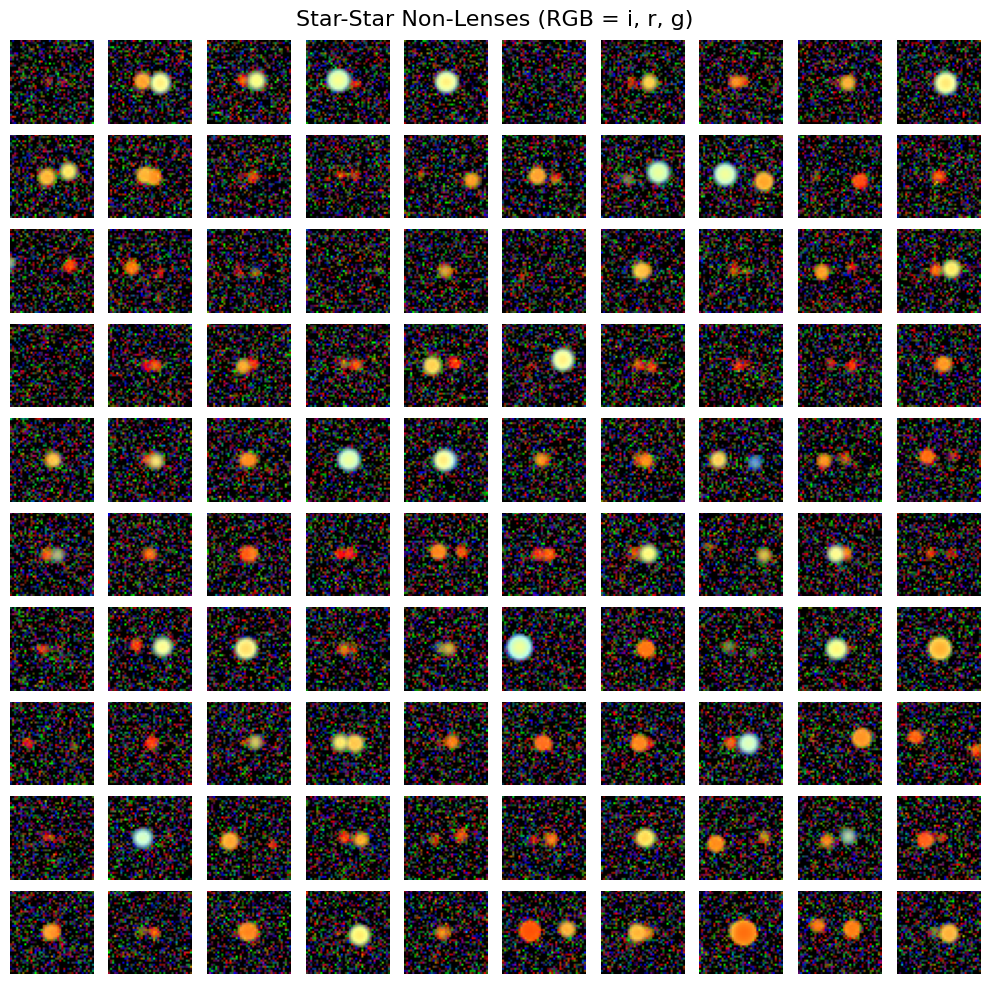

In [11]:
# ==========================================
# Cell 9: Cat 5 - Star-Star 
# Two stars closeby
# ==========================================
fp_star_star = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_star_pop, source_star_pop],
    intruder_number_choices=[[1], [1]],
    cosmo=cosmo,
    clustering_mode="ring",
    include_central_galaxy_light=False,
)
star_star_nonlenses = generate_and_save(fp_star_star, "star_star")
plot_montage(star_star_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Star-Star Non-Lenses (RGB = i, r, g)");

--- Generating 10000 cusp_mimic non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
  Processing batch 4/10...
  Processing batch 5/10...
  Processing batch 6/10...
  Processing batch 7/10...
  Processing batch 8/10...
  Processing batch 9/10...
  Processing batch 10/10...
  Pickling objects to disk (this might take a moment)...
Saved 10000 objects to ../saved_objects/nonlenses_cusp_mimic_10000.pkl



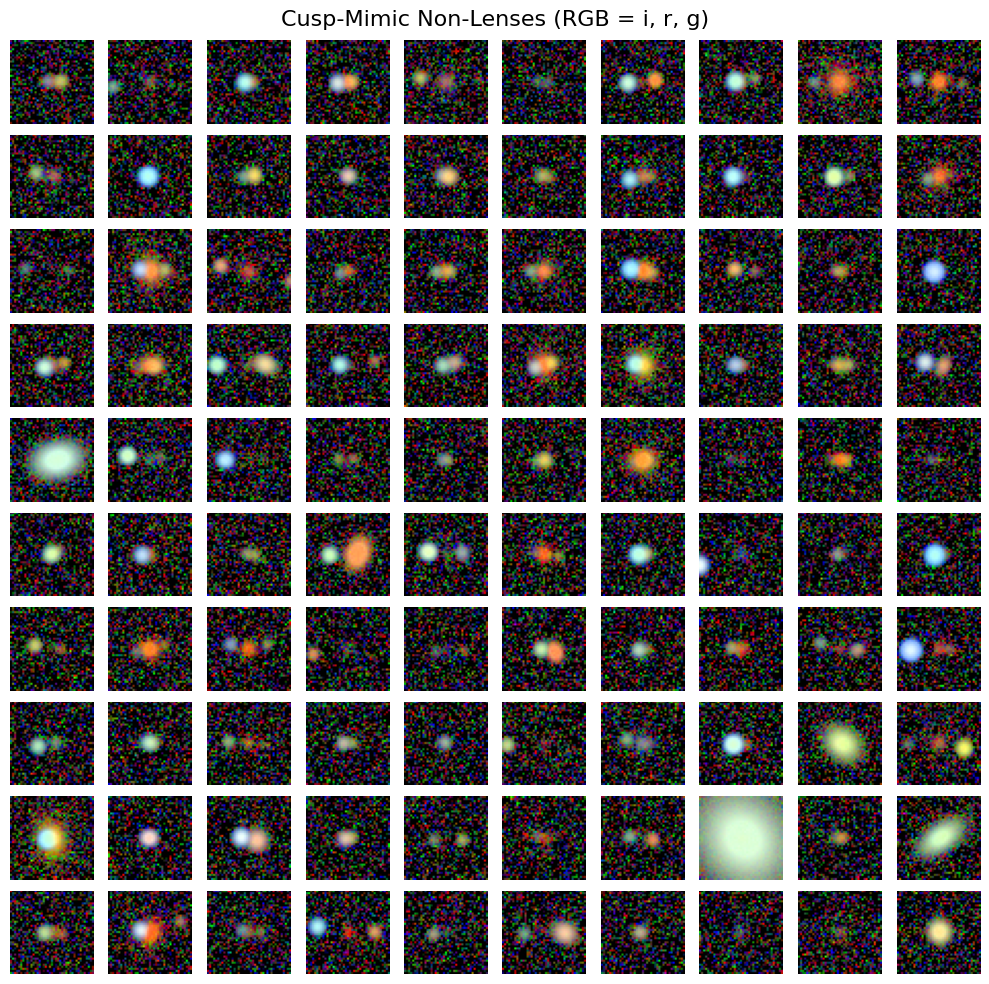

In [5]:
# ==========================================
# Cell 10: Cat 6 - Cusp-Mimic
# Central Gal + 1 Gal (Arc mimic) + 1 AGN (Counter-image mimic)
# ==========================================
fp_cusp_mimic = FalsePositivePop(
    central_galaxy_population=lens_galaxy_pop,
    intruder_populations=[source_galaxy_pop, source_quasar_pop],
    intruder_number_choices=[[1], [1]], 
    cosmo=cosmo,
    clustering_mode="ring", 
    include_central_galaxy_light=True,
)
cusp_mimic_nonlenses = generate_and_save(fp_cusp_mimic, "cusp_mimic")
plot_montage(cusp_mimic_nonlenses, 
             number_to_plot=100, num_cols=10, coadd_years=1,random_seed=42,
             rgb_bands=["i", "r", "g"],
             plot_title="Cusp-Mimic Non-Lenses (RGB = i, r, g)");

In [ ]:
# ==========================================
# Cell 11: Cat 7 - Quad-Compact-Mimic
# Central Gal + 2, 3, or 4 compact blue galaxies (No point sources)
# ==========================================
# fp_quad_compact_mimic = FalsePositivePop(
#     central_galaxy_population=lens_galaxy_pop,
#     intruder_populations=[source_galaxy_pop],
#     intruder_number_choices=[[2, 3, 4]], # Randomly chooses between 2 and 4 galaxies
#     cosmo=cosmo,
#     clustering_mode="ring",
#     include_central_galaxy_light=True,
# )
# quad_compact_mimic_nonlenses = generate_and_save(fp_quad_compact_mimic, "quad_compact_mimic")

--- Generating 10000 quad_compact_mimic non-lenses in batches of 1000 ---
  Processing batch 1/10...
  Processing batch 2/10...
  Processing batch 3/10...
